# End-to-end Multi-class Dog Breed Classification

This notbook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem 
Identifying the breed of a dog given an image of a dog

When sitting at a cafe and taking a photo of a dog, would like to know the breed

## 2. Data

Kagels dog breeds

https://www.kaggle.com/c/dog-breed-identification/overview

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* dealing with images(unstrucured data) best to use deap learning/transfer learning
* there are 120 different breeds of dogs aka 120 different classes
* 10,000 plus images in training set
* 10,000 plus images in test set

In [ ]:
# !unzip "drive/MyDrive/dog-vision/dog-breed-identification.zip" -d "drive/MyDrive/dog-vision/"

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
#print(hub.__version__)

# Check GPU avaliability
# print('GPU', 'Available' if tf.config.list_logical_devices('GPU') else 'not available')

## Getting our data ready (turning into tensors)
We will turn our pictures into numerical data for the machine learning model

Lets access the data and check the labels

In [ ]:
labels_csv = pd.read_csv("drive/MyDrive/dog-vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     c5ca525e7477a7cd05bacd9544995397  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
# How many images are there of each breed?
labels_csv['breed'].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
briard                   66
eskimo_dog               66
Name: breed, Length: 120, dtype: int64

In [ ]:
# View an image
from IPython.display import Image
# Image("drive/MyDrive/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg")

### Getting images and their labels
List of all image path names

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's 
filenames = ["drive/MyDrive/dog-vision/train/" + fname for fname in labels_csv['id'] + ".jpg"]

# Check the first 10
filenames[:10]

['drive/MyDrive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir('drive/MyDrive/dog-vision/train/')) == len(filenames):
  print('File lengths match')
else:
  print('File lengths do no match')

File lengths match


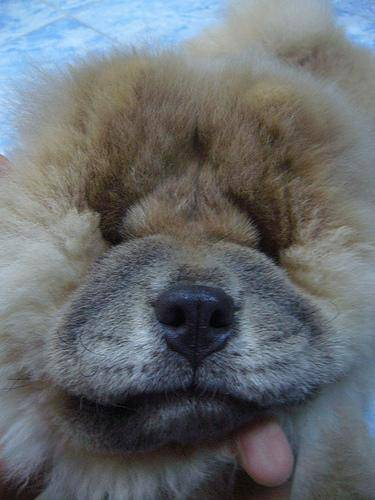

In [ ]:
# One more format check
Image(filenames[550])

In [ ]:
labels_csv['breed'][550]

'chow'

Since we've now got our training files in a list, lets prepare the labels

In [ ]:
labels = labels_csv['breed'].to_numpy()
# labels = np.array(labels) does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(filenames) == len(labels):
  print('does match')
else:
  print('does not match')

does match


In [ ]:
# Find the unique label vales
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every labels into a boolean label array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Turn boolean array into integers
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating our own validation set

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

Start off with ~1000 images

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 2500 #@param {type:'slider', min:1000, max:10222, step:500}

In [ ]:
import sys
sys.path

['',
 '/content',
 '/env/python',
 '/usr/lib/python37.zip',
 '/usr/lib/python3.7',
 '/usr/lib/python3.7/lib-dynload',
 '/usr/local/lib/python3.7/dist-packages',
 '/usr/lib/python3/dist-packages',
 '/usr/local/lib/python3.7/dist-packages/IPython/extensions',
 '/root/.ipython']

In [ ]:
# Split into train and validation sets
from sklearn.model_selection import train_test_split


# Split them into trainging and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2, 
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(2000, 2000, 500, 500)

In [ ]:
# Training data
X_train[:5], y_train[:2]

(['drive/MyDrive/dog-vision/train/332c413119b474653ecca0f358c85e1f.jpg',
  'drive/MyDrive/dog-vision/train/3059a265274759f6a68a553bb3ed865f.jpg',
  'drive/MyDrive/dog-vision/train/2dfc5a83323990d5e42e2912dc1a884a.jpg',
  'drive/MyDrive/dog-vision/train/39eb055caee27cc3110ad26459fb64f9.jpg',
  'drive/MyDrive/dog-vision/train/0b102a6aa442aed98f137616e924e18e.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False,  True, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing images (turning images into Tensors)

To preprocess into Tensors we will write a function which will:
1. Take an image filepath
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` into Tensors
4. Normalize the `image`
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`

In [ ]:
# Convert image to a NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Build funciton:

In [ ]:
# Define image size
IMG_SIZE = 224

# Function for preprocessing images
def process_image(image_path):
  '''
  Takes an image filepath and turns the image into a Tensor
  '''
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn jpeg image into numeric Tensor with 3 color chanels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the colour channel values from 0-255 to 0-1 values (Scale the values with normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to a constant value
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

In order to use TensorFLow effectively, we need our data in the form of Tensor tuples which look like `(image, label)`

In [ ]:
# Create a simple function to return a tuple of tensors
def get_image_label(image_path, label):
  '''
  Takes an image filepath name and the associated label,
  processes the image and returns a tuple of (image, label)
  '''
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of above
get_image_label(X[42], y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, lets make a function to turn all of our X & y data into batches of size 32

In [ ]:
# Define the batch size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if its training data but does not shuffle if it is validation data
  Also accepts test data as input (no labels)
  '''

  # If the data is a test dataset, we probalbly dont have to have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)

  # If the data is a valid dataset, we dont beed to shuffle it
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)

  else:
    print('Creating training data branches...')
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffle pathnames and labels before mapping image processor function is faster than shuffling after
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  print('Done!')
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data branches...
Done!
Creating validation data batches...
Done!


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Data is now in batches, lets visualize it

In [ ]:
import matplotlib.pyplot as plt

# CReate a function for viewing images in a data batch
def show_25_images(images, labels):
  '''
  Displays a plot of 25 images and their labels from a data batch.
  '''

  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')

In [ ]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.9921569 , 1.        , 0.9960785 ],
          [0.9921569 , 1.        , 0.9960785 ],
          [0.99152666, 1.        , 0.9960785 ],
          ...,
          [1.        , 1.        , 1.        ],
          [1.        , 1.        , 1.        ],
          [1.        , 1.        , 1.        ]],
 
         [[0.9960785 , 0.9960785 , 0.9960785 ],
          [0.9921569 , 1.        , 0.9960785 ],
          [0.9921569 , 1.        , 0.9960785 ],
          ...,
          [1.        , 1.        , 1.        ],
          [1.        , 1.        , 1.        ],
          [1.        , 1.        , 1.        ]],
 
         [[0.9960785 , 0.9960785 , 0.9960785 ],
          [0.99484426, 0.9973127 , 0.9960785 ],
          [0.99484426, 0.9973127 , 0.9960785 ],
          ...,
          [1.        , 1.        , 1.        ],
          [1.        , 1.        , 1.        ],
          [1.        , 1.        , 1.        ]],
 
         ...,
 
         [[0.42436588, 0.28501013, 0.23945689],
          [0.44663

In [ ]:
len(train_images), len(train_labels)

(32, 32)

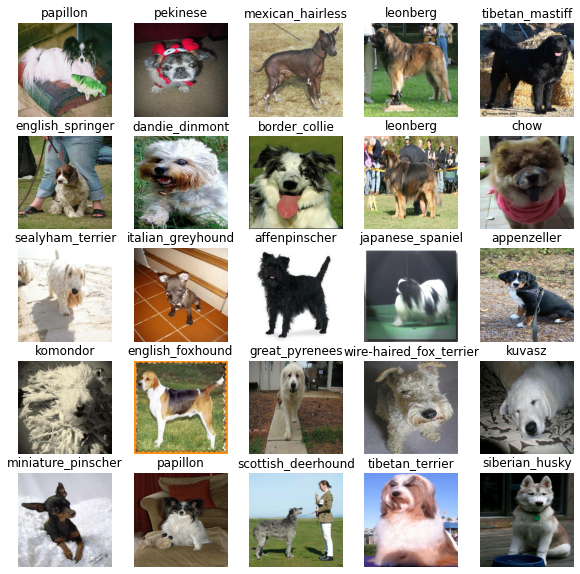

In [ ]:
# Now lets visualize the data in a training batch
show_25_images(train_images, train_labels)

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

## Building a model
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (images labels, in the form of Tensors) of our model
* The URL of the model we want to use


In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels 

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v1_025_224/classification/5'

We have inputs, outputs and model ready to go.
Lets put them together into a Keras deep learning model.

Function:
* Takes the input shape, output shape, and the model we've chosen as parameters
* Defines the layers in a Keras model in sequential fashion
* Compiles the model
* Builds the model
* Returns the model 

Steps can be found: https://tfhub.dev/google/imagenet/mobilenet_v1_025_224/classification/5

In [ ]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with:', MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
            hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
            tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                  activation='softmax') # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
outputs = np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v1_025_224/classification/5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              475801    
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 596,041
Trainable params: 120,240
Non-trainable params: 475,801
_________________________________________________________________


# Create callbacks

callbacks are helper functions a model can use during training to do such things as save progress, check progress, or stop training early if a model stops improving

Two call backs:
* TensorBoard - track model progress
* Early Stopping - prevents model from training too long

## TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our models `fit()` function
3. Visualize our models training logs with the `%tensorboard` magic function

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing tensorboard logs
  logdir = os.path.join('drive/MyDrive/dog-vision/logs',
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

## Training a model (on a subset of data)
Our first model is only going to train on 1000 images, to make sure it works properly

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
print('GPU', 'available' if tf.config.list_physical_devices('GPU') else 'Oof')

GPU Oof


Lets create a function that trains a model.
* Create a model using `create_model()`
* Steup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs and the callbacks we would like to use
* Return the model

In [ ]:
# Build a functino to train and return a trained model
def train_model():
  '''
  Trains a given model and returns the trained version
  '''

  # Create the model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v1_025_224/classification/5
Epoch 1/100
63/63 [==============================] - 816s 13s/step - loss: 7.3775 - accuracy: 0.0810 - val_loss: 4.8581 - val_accuracy: 0.1620
Epoch 2/100
63/63 [==============================] - 10s 158ms/step - loss: 3.3573 - accuracy: 0.2910 - val_loss: 4.1768 - val_accuracy: 0.2500
Epoch 3/100
63/63 [==============================] - 10s 154ms/step - loss: 2.2861 - accuracy: 0.4395 - val_loss: 4.0689 - val_accuracy: 0.2700
Epoch 4/100
63/63 [==============================] - 10s 159ms/step - loss: 1.6433 - accuracy: 0.5560 - val_loss: 4.0860 - val_accuracy: 0.2720
Epoch 5/100
63/63 [==============================] - 10s 157ms/step - loss: 1.2676 - accuracy: 0.6445 - val_loss: 3.7324 - val_accuracy: 0.2860
Epoch 6/100
63/63 [==============================] - 10s 155ms/step - loss: 0.9781 - accuracy: 0.7195 - val_loss: 3.9932 - val_accuracy: 0.3080
Epoch 7/100
63/63 [=========================

**Note:** Overfitting at the begining is a good thing and means the model is learning

### Checking the TensorBoard logs
The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents

In [ ]:
%tensorboard --logdir drive/MyDrive/dog-vision/logs/

<IPython.core.display.Javascript object>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

16/16 [==============================] - 2s 115ms/step


array([[2.73450179e-10, 1.30941143e-13, 8.84353312e-07, ...,
        9.89883847e-05, 5.74875514e-07, 7.59287195e-15],
       [2.26083557e-07, 2.83951056e-04, 1.03711640e-11, ...,
        1.19645601e-05, 2.20361721e-06, 2.65965082e-05],
       [2.43889787e-11, 1.26300264e-11, 3.91319723e-08, ...,
        1.07395988e-06, 4.41386077e-13, 1.13219032e-13],
       ...,
       [5.56604896e-09, 2.26612769e-07, 3.98024422e-05, ...,
        1.82991556e-03, 2.12040703e-07, 2.62674438e-09],
       [4.51925644e-08, 7.25880938e-08, 2.07603662e-07, ...,
        2.20397033e-06, 3.71147416e-06, 1.37481837e-09],
       [1.39325565e-11, 3.15956594e-09, 7.92077428e-12, ...,
        2.82670117e-05, 1.90343510e-08, 8.58140555e-12]], dtype=float32)

In [ ]:
predictions.shape # 200 arrays of 120 different numbers

(500, 120)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# Prediction Reuslts

def prediction_results(index):
  '''
  Outputs severall prediction results
  '''
  print(predictions[index])
  print(f"Max value (probability of prediction): {np.max(predictions[index])}")
  print(f"Sum: {np.sum(predictions[index])}")
  print(f"Max Index: {np.argmax(predictions[index])}")
  print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

In [ ]:
# First prediction
prediction_results(0)

[2.73450179e-10 1.30941143e-13 8.84353312e-07 3.81311906e-07
 3.31901305e-04 9.36170618e-05 7.53488050e-10 2.37115128e-05
 2.64289579e-03 5.22461869e-06 6.94518576e-08 2.32603173e-11
 1.01155752e-06 8.36152481e-09 2.46671494e-03 1.31373572e-05
 1.29885980e-09 3.57764875e-05 1.12585049e-07 1.47079726e-08
 1.44061152e-12 4.43734425e-05 2.02314780e-07 9.18277715e-13
 5.47181466e-04 1.68791215e-04 4.26226112e-12 1.12495973e-05
 6.61536679e-02 7.85164666e-05 6.53233578e-10 9.15841708e-12
 3.97547240e-08 3.02880892e-07 2.47466652e-13 6.79263503e-13
 4.48969058e-06 3.85966082e-03 4.84151634e-08 8.56491089e-01
 5.82240089e-11 4.19514876e-08 3.58159309e-06 1.34910681e-06
 4.68817483e-08 2.03725925e-10 1.48477975e-05 1.46879567e-04
 8.44705528e-10 4.55645868e-08 1.35542133e-09 3.61172425e-07
 9.07120545e-10 1.72592792e-07 8.96047039e-12 7.58965686e-03
 1.74798629e-06 8.83004577e-06 4.11206003e-09 5.15046272e-09
 1.93866454e-02 8.20159235e-14 9.01449993e-20 6.65499147e-06
 1.44515733e-13 3.064573

In [ ]:
# Prediction 42
prediction_results(42)

[8.29374514e-10 1.60695970e-11 6.99611647e-13 1.82202449e-08
 2.00023377e-18 1.04985228e-13 5.14450912e-05 3.90179100e-13
 9.27094290e-10 1.89969466e-14 2.20002229e-18 3.19076878e-13
 1.76819347e-13 3.51367495e-14 5.34948530e-10 3.22354394e-13
 6.24996000e-14 1.27461313e-08 2.54744712e-13 1.30112512e-18
 4.74101487e-11 1.00820578e-12 1.31303456e-14 8.75092387e-10
 1.52907997e-09 3.03765564e-14 2.24345387e-09 2.11943987e-11
 4.97215286e-15 1.43738848e-13 1.11443569e-12 2.13853796e-14
 1.62143499e-09 1.17226329e-09 1.47798961e-17 2.41035455e-11
 1.22141148e-13 9.46251215e-13 1.13245880e-15 8.43563390e-19
 6.32938868e-10 2.71621295e-15 2.24256991e-15 2.83876845e-16
 8.14492144e-15 2.92446108e-15 1.03532903e-11 6.38215812e-14
 4.79138007e-10 1.94538316e-10 2.76118701e-08 4.63711881e-12
 2.33360351e-15 6.65595949e-16 3.63171305e-16 2.09859732e-16
 7.00703717e-10 3.77373288e-09 8.19056296e-16 9.62220640e-16
 3.39776997e-15 4.48942351e-18 3.77932549e-15 6.63173162e-12
 5.80312595e-17 4.210996

In [ ]:
unique_breeds[55]

'ibizan_hound'

Having the above functionality is great but we want to be able to do it at scale.

And it would be better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(pred_probs):
  '''
  Turns an array of prediction probabilities into a label
  '''
  return unique_breeds[np.argmax(pred_probs)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[25])
pred_label

NameError: ignored

Since our validation data is still in a batch dataset, we'll have to unbatch it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  '''
  Takes a batched dataset of (image,label) Tensors and returns 
  seperate arrays of images and labels
  '''
  images_ = []
  labels_ = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  
  return images_, labels_


In [ ]:
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.567492  , 0.58709985, 0.59886456],
         [0.516252  , 0.5358598 , 0.5476245 ],
         [0.49975574, 0.5193636 , 0.5311283 ],
         ...,
         [0.6705464 , 0.69015425, 0.7058405 ],
         [0.6581984 , 0.67780626, 0.69349253],
         [0.654902  , 0.6745098 , 0.6901961 ]],
 
        [[0.43688455, 0.4564924 , 0.4682571 ],
         [0.43975022, 0.45935807, 0.47112277],
         [0.46396187, 0.4835697 , 0.49533442],
         ...,
         [0.63760257, 0.6572104 , 0.6728967 ],
         [0.6509737 , 0.6705815 , 0.6862678 ],
         [0.65471816, 0.674326  , 0.6900123 ]],
 
        [[0.47594926, 0.4955571 , 0.5073218 ],
         [0.44747055, 0.4670784 , 0.4788431 ],
         [0.44722435, 0.4668322 , 0.4785969 ],
         ...,
         [0.6683862 , 0.68799406, 0.70368034],
         [0.6534614 , 0.67306924, 0.6887555 ],
         [0.6503677 , 0.6699755 , 0.6856618 ]],
 
        ...,
 
        [[0.53658885, 0.5561967 , 0.57188296],
         [0.5361925 , 0.5558003 , 0.57148

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
#get_pred_label(val_images[0])

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Lets make some function to make these all a bit more visualizable

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers
* Convert the prediction probabilities to a predicted label
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot

In [ ]:
def plot_pred(pred_probs, labels, images, n=1):
  '''
  View the prediction, ground truth and image sample for n
  '''
  pred_prob, true_label, image = pred_probs[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title for predictions
  if pred_label == true_label:
    color='green'
  else:
    color='red'

  # Change plot title
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
            color=color)

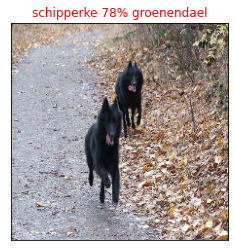

In [ ]:
plot_pred(pred_probs=predictions, 
          labels=val_labels,
          images=val_images,
          n=12)

Now we've got one function to visualize our models top prediction, lets make another to view our models top 10 predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probability indexes
  * Prediction probability values
  * Prediction labels
* Plor the top 10 prediction probability values and labels, coloring the true labels green

In [ ]:
def plot_pred_conf(pred_probs, labels, n=1):
  '''
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  '''
  pred_prob, true_label = pred_probs[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 probabilities 
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')
  
  # Change color of the true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')


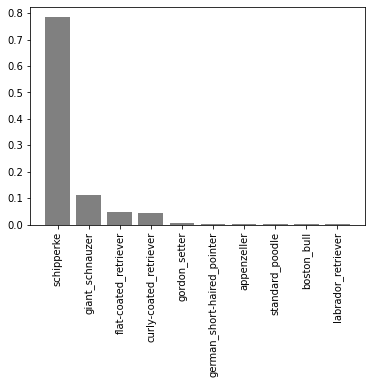

In [ ]:
plot_pred_conf(predictions, val_labels, 12)

In [ ]:
predictions[0].argsort()[-10:][::-1] # Top ten indexes of predicition values

array([ 39,  28,  60, 112, 111,  55, 101,  37,   8,  14])

In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]] # Top ten predicition values

array([0.8564911 , 0.06615367, 0.01938665, 0.01580298, 0.01204417,
       0.00758966, 0.00668278, 0.00385966, 0.0026429 , 0.00246671],
      dtype=float32)

In [ ]:
unique_breeds[predictions[0].argsort()[-10:][::-1]]

array(['english_foxhound', 'chesapeake_bay_retriever',
       'italian_greyhound', 'vizsla', 'toy_terrier', 'ibizan_hound',
       'siberian_husky', 'dingo', 'basset', 'bloodhound'], dtype=object)

Now we've got some functions to help visualize and evaluate the model lets check out a few

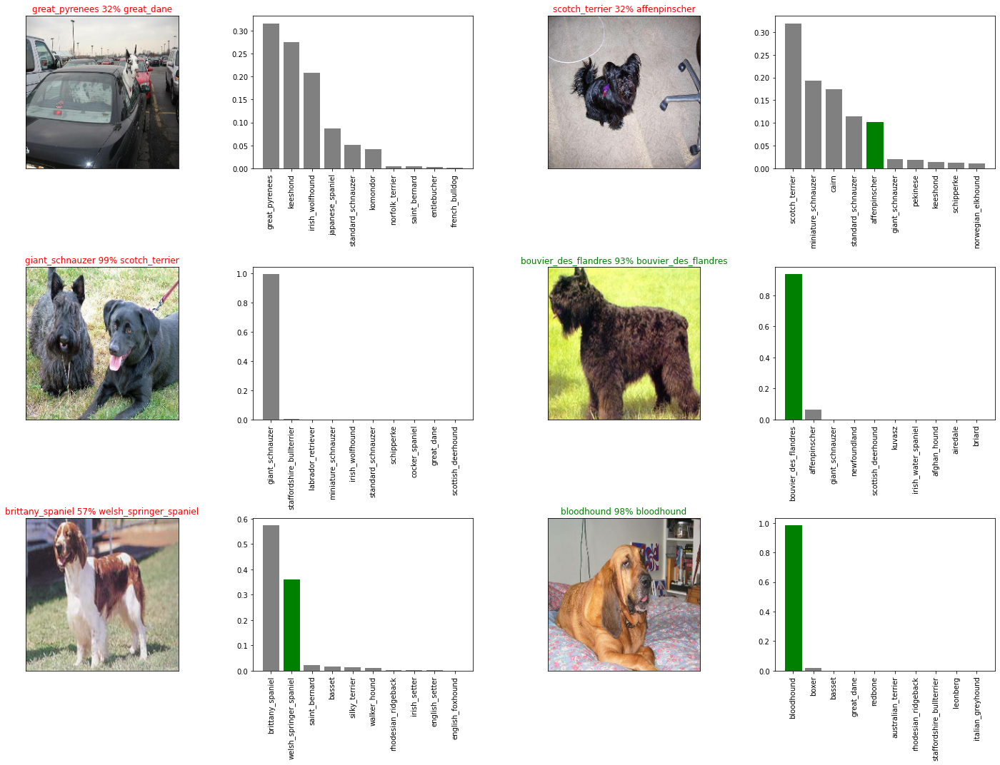

In [ ]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range (num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions, val_labels, val_images, i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, val_labels, i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  '''
  Saves a given model in a models directory and appends a suffix (string).
  '''

  # Create a model directory pathname with current time
  modeldir = os.path.join('drive/MyDrive/dog-vision/models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5' # Save format of model
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path

# Create a function to load a trained model
def load_model(model_path):
  '''
  loads a saved model from a specified path
  '''
  print(f'Loading saved model from: {model_path}')
  model = tf.keras.models.load_model(model_path,
                              custom_objects={'KerasLayer':hub.KerasLayer})
  return model


Now we've got funtions to save and load trained models, lets test them

In [ ]:
# save our model trained on 1000 images
save_model(model, suffix='2500-images-modilenetv2-Adam')

Saving model to: drive/MyDrive/dog-vision/models/20211015-16591634317160-2500-images-modilenetv2-Adam.h5...


'drive/MyDrive/dog-vision/models/20211015-16591634317160-2500-images-modilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_2500_image_model = load_model('drive/MyDrive/dog-vision/models/20211015-16591634317160-2500-images-modilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/dog-vision/models/20211015-16591634317160-2500-images-modilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

16/16 [==============================] - 2s 113ms/step - loss: 3.9082 - accuracy: 0.3020


[3.9081757068634033, 0.3019999861717224]

In [ ]:
# Evaluate the loaded model
loaded_2500_image_model.evaluate(val_data)

16/16 [==============================] - 2s 111ms/step - loss: 3.9082 - accuracy: 0.3020


[3.9081757068634033, 0.3019999861717224]

## Training a big dog model (Full Dataset)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data branches...
Done!


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a model for our full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v1_025_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training all the data, so we cant monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 2346s 7s/step - loss: 4.5370 - accuracy: 0.2329
Epoch 2/100
320/320 [==============================] - 37s 115ms/step - loss: 3.0597 - accuracy: 0.3870
Epoch 3/100
320/320 [==============================] - 37s 115ms/step - loss: 2.7152 - accuracy: 0.4410
Epoch 4/100
320/320 [==============================] - 37s 115ms/step - loss: 2.4818 - accuracy: 0.4844
Epoch 5/100
320/320 [==============================] - 37s 116ms/step - loss: 2.3643 - accuracy: 0.5034
Epoch 6/100
320/320 [==============================] - 36s 113ms/step - loss: 2.2524 - accuracy: 0.5288
Epoch 7/100
320/320 [==============================] - 37s 115ms/step - loss: 2.1957 - accuracy: 0.5349
Epoch 8/100
320/320 [==============================] - 37s 115ms/step - loss: 2.0928 - accuracy: 0.5571
Epoch 9/100
320/320 [==============================] - 36s 112ms/step - loss: 2.0245 - accuracy: 0.5657
Epoch 10/100
320/320 [==============================] - 36s 113ms

In [ ]:
save_model(full_model, suffix='full10k-images-modilenetv2-Adam')

Saving model to: drive/MyDrive/dog-vision/models/20211015-18321634322724-full10k-images-modilenetv2-Adam.h5...


'drive/MyDrive/dog-vision/models/20211015-18321634322724-full10k-images-modilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model('drive/MyDrive/dog-vision/models/20211015-18321634322724-full10k-images-modilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/dog-vision/models/20211015-18321634322724-full10k-images-modilenetv2-Adam.h5


## Making predictions on the test dataset

Since the model has been trained on images translated into the TensorFlow format, we will need to convert the test data into the same format.

This can be accomplished via the `create_data_batches()` function

To make predictions on the test data:
* Get the test image filenames
* Convert the filenames into test data batches using `test_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have any labels)
* Make a predictions array by passing the test batches to the `predict()` method called on our model

In [ ]:
# Load test image filenames
test_path = 'drive/MyDrive/dog-vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/dog-vision/test/e6cbd88414627be43910a1977ce28595.jpg',
 'drive/MyDrive/dog-vision/test/e6e1e02b07347a522f96eba87d29a5c0.jpg',
 'drive/MyDrive/dog-vision/test/dd703c7beeaf5cba5533d5f42b608f2e.jpg',
 'drive/MyDrive/dog-vision/test/e4cffb02169d9b46810d50c6b9eae28d.jpg',
 'drive/MyDrive/dog-vision/test/e07106e5301fbce05cade5c94f775a72.jpg',
 'drive/MyDrive/dog-vision/test/df2d806debebfd39e858f877756518e8.jpg',
 'drive/MyDrive/dog-vision/test/dccc6c6c2f8cb55631b6ce664bf21fee.jpg',
 'drive/MyDrive/dog-vision/test/e70dfb4bf50f74850463cfd35edc8af5.jpg',
 'drive/MyDrive/dog-vision/test/e60df508ef9f70f9c556003827827234.jpg',
 'drive/MyDrive/dog-vision/test/dd7bf84df93991b7c15ec739c82acc04.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data  = create_data_batches(test_filenames, test_data=True)

Creating test data batches...
Done!


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Note:** Calling `predict()` on the full model and passing it the test data batch will take a long time to run

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                            verbose=1)

In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt('drive/MyDrive/dog-vision/preds_array.csv', test_predictions, delimiter=',')

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt('drive/MyDrive/dog-vision/preds_array.csv', delimiter=',') 

In [ ]:
test_predictions.shape

## Preparing test dataset predictions for Kagle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a dataframe with an ID and a column for each different dog breed.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) ti each of the dog breeds columns.
* Export the DataFrame as a CSV to submit it to kaggle.

In [ ]:
['id'] + list(unique_breeds)

['id',
 'affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenen

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
print(preds_df.head())

Empty DataFrame
Columns: [id, affenpinscher, afghan_hound, african_hunting_dog, airedale, american_staffordshire_terrier, appenzeller, australian_terrier, basenji, basset, beagle, bedlington_terrier, bernese_mountain_dog, black-and-tan_coonhound, blenheim_spaniel, bloodhound, bluetick, border_collie, border_terrier, borzoi, boston_bull, bouvier_des_flandres, boxer, brabancon_griffon, briard, brittany_spaniel, bull_mastiff, cairn, cardigan, chesapeake_bay_retriever, chihuahua, chow, clumber, cocker_spaniel, collie, curly-coated_retriever, dandie_dinmont, dhole, dingo, doberman, english_foxhound, english_setter, english_springer, entlebucher, eskimo_dog, flat-coated_retriever, french_bulldog, german_shepherd, german_short-haired_pointer, giant_schnauzer, golden_retriever, gordon_setter, great_dane, great_pyrenees, greater_swiss_mountain_dog, groenendael, ibizan_hound, irish_setter, irish_terrier, irish_water_spaniel, irish_wolfhound, italian_greyhound, japanese_spaniel, keeshond, kelpie,

In [ ]:
# Appends test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e6cbd88414627be43910a1977ce28595,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e6e1e02b07347a522f96eba87d29a5c0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dd703c7beeaf5cba5533d5f42b608f2e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e4cffb02169d9b46810d50c6b9eae28d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e07106e5301fbce05cade5c94f775a72,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

NameError: ignored

In [ ]:
# Save our predictions table to a csv file
preds_df.to_csv('drive/MyDrive/dog-vision/fullModelPredictionsSubmission1.csv',
                index=False)

## Making predicitons on custom images, we'll:
* Get the filepaths of our own custom images
* Turn the filepaths into data batches using `create_data_batches()`
* Pass the custom image data batch to our models `predict()` method
* Convert the prediction output probabilities to prediction labels
* compare the predicted labels to the custom images

In [ ]:
# Get custom image filepaths
custom_path = 'drive/MyDrive/dog-vision/TheBoys/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/dog-vision/TheBoys/MaxAndSpencer.jpg',
 'drive/MyDrive/dog-vision/TheBoys/Max.jpg',
 'drive/MyDrive/dog-vision/TheBoys/Spencer.jpg']

In [ ]:
# Turn custom image into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...
Done!


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels 
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range (len(custom_preds))]
custom_pred_labels

['lakeland_terrier', 'pembroke', 'cardigan']

In [ ]:
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

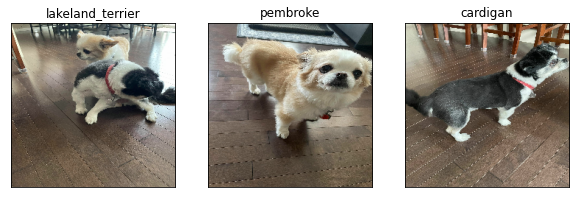

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)